In [1]:
### run this cell
import torch 
import torch.nn as nn
from torch.autograd import Variable
import skimage
import skimage.color as color
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np
import math

In [ ]:
## trainset directory is mydir
mydir = r'Train/'
files = [os.path.join(mydir, f) for f in os.listdir(mydir)]
len(files)

In [ ]:
X = []
i = 0
for image in files:
    i += 1
    if i > 500: break
    img = cv2.imread(image)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = color.rgb2lab(1.0/255*img)
    #img = color.rgb2lab(1.0/255*img)
    X.append(img)
X = np.array(X, dtype = float)

In [ ]:
num = 500
Xtrain = X[:num]
xt = Xtrain[:,:,:,0]
yt = Xtrain[:,:,:,1:]
yt = yt/128
xt.shape

In [ ]:
xxt = np.zeros((num, 1, 256, 256))

yyt = np.zeros((num, 2, 256, 256))
for i in range(num):
    xxt[i][0][:,:] = xt[i][:,:]
    yyt[i][0][:,:] = yt[i][:,:,0]
    yyt[i][1][:,:] = yt[i][:,:,1]

In [ ]:
def random_mini_batches(X, Y, mini_batch_size = 32, seed = 0):    
    m = X.shape[0]                  # number of training examples
    mini_batches = []
    np.random.seed(seed)
    
    # Step 1: Shuffle (X, Y)
    permutation = list(np.random.permutation(m))
    shuffled_X = X[permutation,:,:,:]
    shuffled_Y = Y[permutation,:,:,:]

    # Step 2: Partition (shuffled_X, shuffled_Y). Minus the end case.
    num_complete_minibatches = math.floor(m/mini_batch_size) # number of mini batches of size mini_batch_size in your partitionning
    for k in range(0, num_complete_minibatches):
        mini_batch_X = shuffled_X[k * mini_batch_size : k * mini_batch_size + mini_batch_size,:,:,:]
        mini_batch_Y = shuffled_Y[k * mini_batch_size : k * mini_batch_size + mini_batch_size,:,:,:]
        mini_batch = (mini_batch_X, mini_batch_Y)
        mini_batches.append(mini_batch)
    
    # Handling the end case (last mini-batch < mini_batch_size)
    if m % mini_batch_size != 0:
        mini_batch_X = shuffled_X[num_complete_minibatches * mini_batch_size : m,:,:,:]
        mini_batch_Y = shuffled_Y[num_complete_minibatches * mini_batch_size : m,:,:,:]
        mini_batch = (mini_batch_X, mini_batch_Y)
        mini_batches.append(mini_batch)
    
    return mini_batches


In [2]:
## run this cell
class CNN(nn.Module):
    def __init__(self):
        super(CNN, self).__init__()
        self.layer1 = nn.Sequential(nn.Conv2d(1, 8, kernel_size=(3, 3), stride = (2, 2), padding=(1, 1)),nn.ReLU())
        self.layer2 = nn.Sequential(nn.Conv2d(8, 8, kernel_size=(3, 3), stride = (1, 1), padding=(1, 1)),nn.ReLU())
        self.layer3 = nn.Sequential(nn.Conv2d(8, 8, kernel_size=(3, 3), stride = (1, 1), padding=(1, 1)),nn.ReLU())
        self.layer4 = nn.Sequential(nn.Conv2d(8, 16, kernel_size=(3, 3), stride = (2, 2), padding=(1, 1)),nn.ReLU())
        self.layer5 = nn.Sequential(nn.Conv2d(16, 16, kernel_size=(3, 3), stride = (1, 1), padding=(1, 1)),nn.ReLU())
        self.layer6 = nn.Sequential(nn.Conv2d(16, 16, kernel_size=(3, 3), stride = (1, 1), padding=(1, 1)),nn.ReLU())
        self.layer7 = nn.Sequential(nn.Conv2d(16, 32, kernel_size=(3, 3), stride = (2, 2), padding=(1, 1)),nn.ReLU())
        self.layer8 = nn.Sequential(nn.Conv2d(32, 32, kernel_size=(3, 3), stride = (1, 1), padding=(1, 1)),nn.ReLU())
        self.layer9 = nn.Sequential(nn.Conv2d(32, 32, kernel_size=(3, 3), stride = (1, 1), padding=(1, 1)),nn.ReLU())
        self.layer10 = nn.Sequential(nn.Conv2d(32, 64, kernel_size=(3, 3), stride = (2, 2), padding = (1, 1)),nn.ReLU())
        self.layer11 = nn.Sequential(nn.Conv2d(64, 64, kernel_size=(3, 3), stride = (1, 1), padding=(1, 1)),nn.ReLU())
        self.layer12 = nn.Sequential(nn.Conv2d(64, 64, kernel_size=(3, 3), stride = (1, 1), padding=(1, 1)),nn.ReLU())
        self.layer13 = nn.Sequential(nn.Conv2d(64, 128, kernel_size=(3, 3), stride = (2, 2), padding=(1, 1)),nn.ReLU())
        self.layer14 = nn.Sequential(nn.Conv2d(128, 128, kernel_size=(3, 3), stride = (1, 1), padding=(1, 1)),nn.ReLU())
        self.layer15 = nn.Sequential(nn.Conv2d(128, 128, kernel_size=(3, 3), stride = (1, 1), padding=(1, 1)),nn.ReLU())
        #self.layer16 = nn.Sequential(nn.Conv2d(128, 256, kernel_size=(3, 3), stride = (2, 2), padding=1),nn.ReLU())
        #self.layer17 = nn.Sequential(nn.Conv2d(256, 256, kernel_size=(3, 3), stride = (1, 1), padding=1),nn.ReLU())
        #self.layer18 = nn.Sequential(nn.Conv2d(256, 256, kernel_size=(3, 3), stride = (1, 1), padding=1),nn.ReLU())
        #self.layer19 = nn.Sequential(nn.Upsample(scale_factor=2, mode = 'bilinear'))
        #self.layer20 = nn.Sequential(nn.Conv2d(256, 256, kernel_size=(3, 3), stride = (1, 1), padding=1),nn.ReLU())
        self.layer21 = nn.Sequential(nn.Upsample(scale_factor=2, mode = 'bilinear'))
        self.layer22 = nn.Sequential(nn.Conv2d(128, 128, kernel_size=(3, 3), stride = (1, 1), padding=(1, 1)),nn.ReLU())
        self.layer23 = nn.Sequential(nn.Upsample(scale_factor=2, mode = 'bilinear'))
        self.layer24 = nn.Sequential(nn.Conv2d(128, 64, kernel_size=(3, 3), stride = (1, 1), padding=(1, 1)),nn.ReLU())
        self.layer25 = nn.Sequential(nn.Upsample(scale_factor=2, mode = 'bilinear'))
        self.layer26 = nn.Sequential(nn.Conv2d(64, 32, kernel_size=(3, 3), stride = (1, 1), padding=(1, 1)),nn.ReLU())
        self.layer27 = nn.Sequential(nn.Upsample(scale_factor=2, mode = 'bilinear'))
        self.layer28 = nn.Sequential(nn.Conv2d(32, 16, kernel_size=(3, 3), stride = (1, 1), padding=(1, 1)),nn.ReLU())
        self.layer29 = nn.Sequential(nn.Upsample(scale_factor=2, mode = 'bilinear'))
        self.layer30 = nn.Sequential(nn.Conv2d(16, 2, kernel_size=(3, 3), stride = (1, 1), padding=(1, 1)),nn.Tanh())
        
    def forward(self, x):
        out = self.layer1(x)
        out = self.layer2(out)
        out = self.layer3(out)
        out = self.layer4(out)
        out = self.layer5(out)
        out = self.layer6(out)
        out = self.layer7(out)
        out = self.layer8(out)
        out = self.layer9(out)
        out = self.layer10(out)
        out = self.layer11(out)
        out = self.layer12(out)
        out = self.layer13(out)
        out = self.layer14(out)
        out = self.layer15(out)
        #out = self.layer16(out)
        #out = self.layer17(out)
        #out = self.layer18(out)
        #out = self.layer19(out)
        #out = self.layer20(out)
        out = self.layer21(out)
        out = self.layer22(out)
        out = self.layer23(out)
        out = self.layer24(out)
        out = self.layer25(out)
        out = self.layer26(out)
        out = self.layer27(out)
        out = self.layer28(out)
        out = self.layer29(out)
        out = self.layer30(out)
        return out

In [ ]:
cnn = CNN()
cnn.cuda()

In [ ]:
criterion = nn.MSELoss()
optimizer = torch.optim.RMSprop(cnn.parameters(), lr=0.001, alpha = 0.9, weight_decay =0.0 , eps=1e-07)

In [ ]:
seed=0
for epoch in range(600):
    seed += 1
    batch_count = 0
    epoch_loss = 0
    num_minibatches = int(num/32)
    minibatches = random_mini_batches(xxt, yyt, 32, seed)
    for minibatch in minibatches:
        batch_count += 1
        images = Variable(torch.Tensor(minibatch[0])).cuda()
        labels = Variable(torch.Tensor(minibatch[1])).cuda()
        #images = Variable(torch.Tensor(xxt)).cuda()
        #labels = Variable(torch.Tensor(yyt)).cuda()
        optimizer.zero_grad()
        outputs = cnn(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        epoch_loss += loss.data[0]/num_minibatches
        print('Epoch [%d/%d]  Batch[%d/%d]  loss %.6f' %(epoch+1, 400, batch_count, num_minibatches, loss.data[0]))
    if epoch_loss < 0.0030 : break
    print('Epoch Loss [%d/%d]  loss %.6f' %(epoch+1, 400, loss.data[0]))

In [ ]:
torch.save(cnn,"py500.pt")

In [3]:
## run this cell
model = torch.load("py500.pt")

In [4]:
## run this cell
model.eval()

CNN(
  (layer1): Sequential(
    (0): Conv2d (1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU()
  )
  (layer2): Sequential(
    (0): Conv2d (8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
  )
  (layer3): Sequential(
    (0): Conv2d (8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
  )
  (layer4): Sequential(
    (0): Conv2d (8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU()
  )
  (layer5): Sequential(
    (0): Conv2d (16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
  )
  (layer6): Sequential(
    (0): Conv2d (16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
  )
  (layer7): Sequential(
    (0): Conv2d (16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU()
  )
  (layer8): Sequential(
    (0): Conv2d (32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
  )
  (layer9): Sequential(
    (0): Conv2d (3

In [5]:
## run this cell
## tst has test set directory
tst = r'Test/'
tfiles = [os.path.join(tst, f) for f in os.listdir(tst)]
len(tfiles)

109

In [6]:
## run this cell
Xte = []
testnum = len(tfiles)
for image in tfiles:
    img = cv2.imread(image)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = color.rgb2lab(1.0/255*img)
    #img = color.rgb2lab(1.0/255*img)
    Xte.append(img)
Xte = np.array(Xte, dtype = float)
Xtest = Xte[:testnum]
xtt = Xtest[:,:,:,0]
xtest = np.zeros((testnum, 1, 256, 256))
for i in range(testnum):
    xtest[i][0][:,:] = xtt[i][:,:]

grayscale image


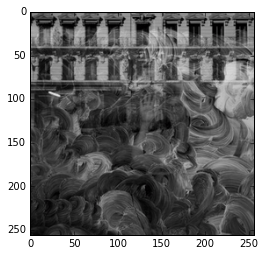

colored image


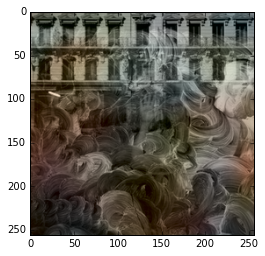

grayscale image


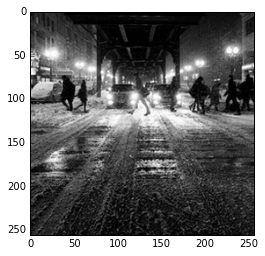

colored image


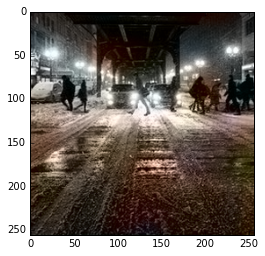

grayscale image


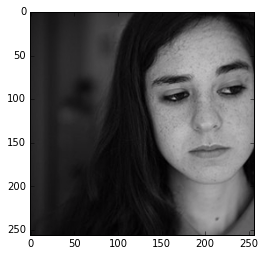

colored image


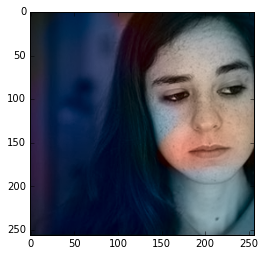

grayscale image


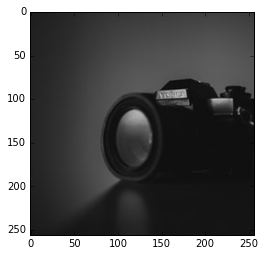

colored image


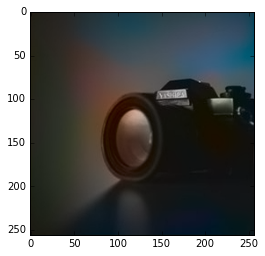

grayscale image


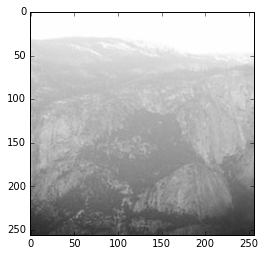

colored image


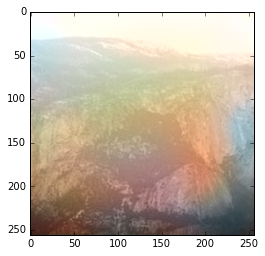

grayscale image


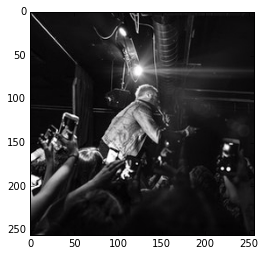

colored image


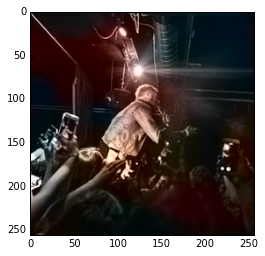

grayscale image


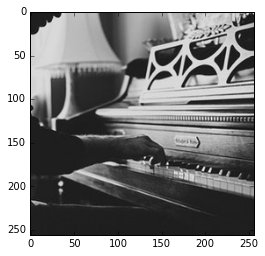

colored image


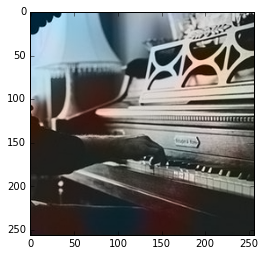

grayscale image


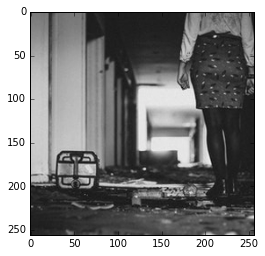

colored image


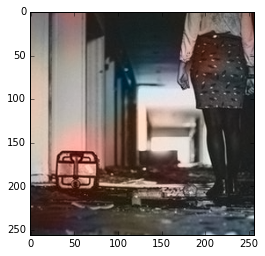

grayscale image


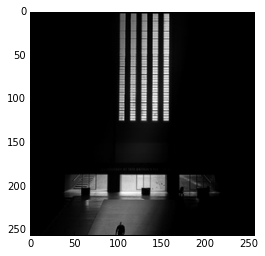

colored image


C:\Users\hp\Anaconda3\envs\tensorflow-gpu\lib\site-packages\skimage\color\colorconv.py:985: UserWarning: Color data out of range: Z < 0 in 993 pixels
  warn('Color data out of range: Z < 0 in %s pixels' % invalid[0].size)


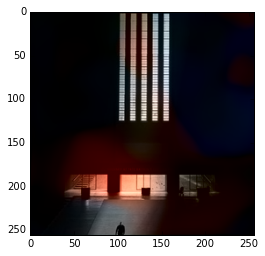

grayscale image


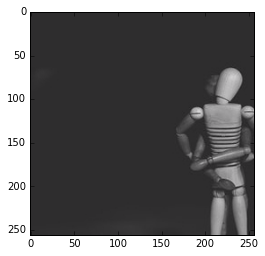

colored image


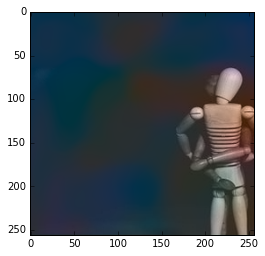

grayscale image


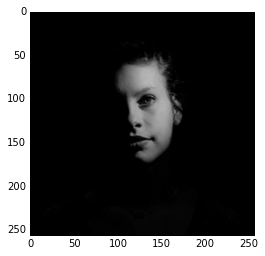

colored image


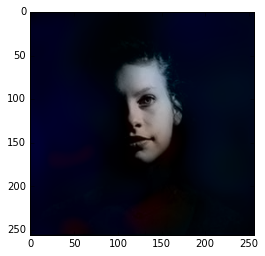

grayscale image


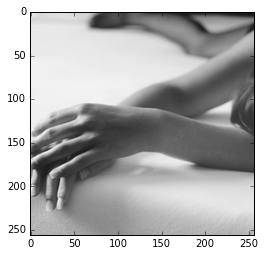

colored image


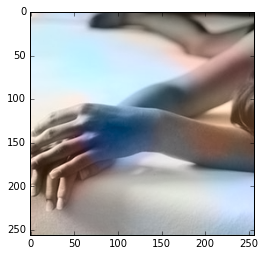

grayscale image


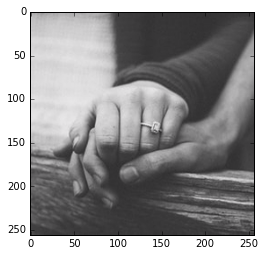

colored image


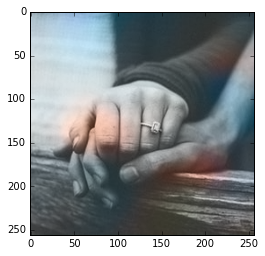

grayscale image


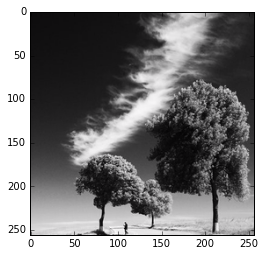

colored image


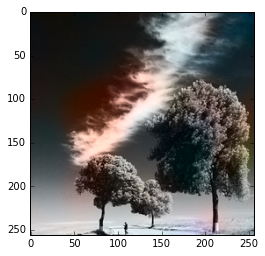

grayscale image


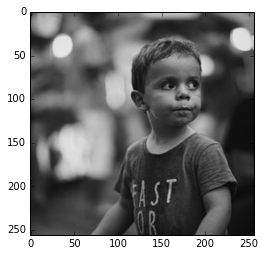

colored image


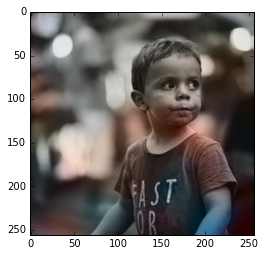

grayscale image


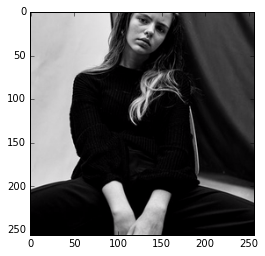

colored image


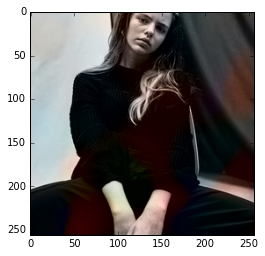

grayscale image


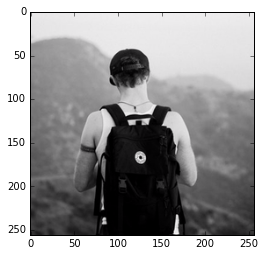

colored image


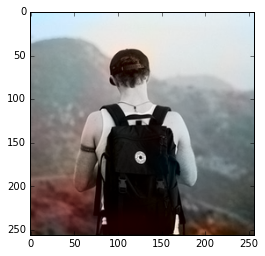

grayscale image


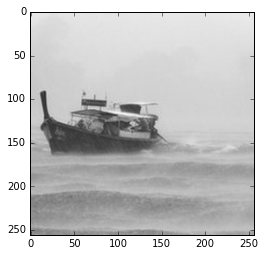

colored image


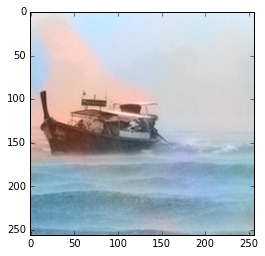

grayscale image


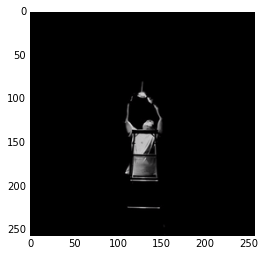

colored image


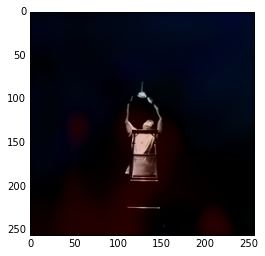

grayscale image


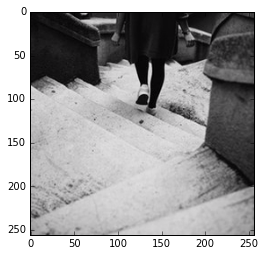

colored image


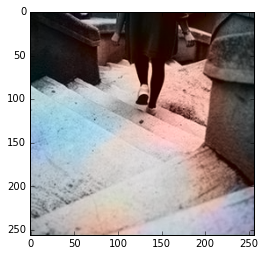

grayscale image


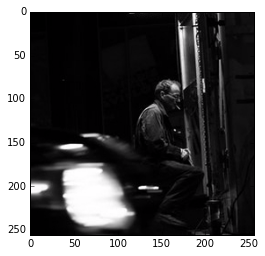

colored image


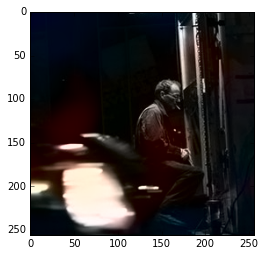

grayscale image


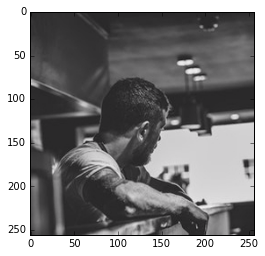

colored image


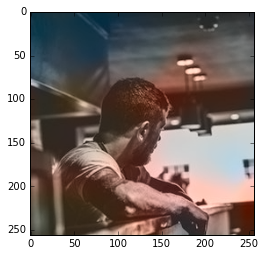

grayscale image


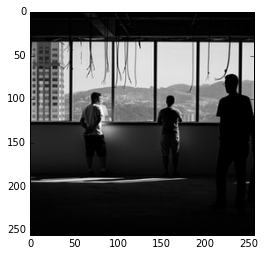

colored image


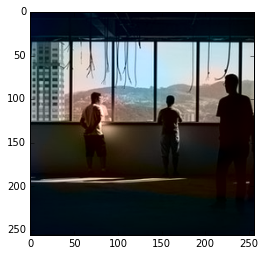

grayscale image


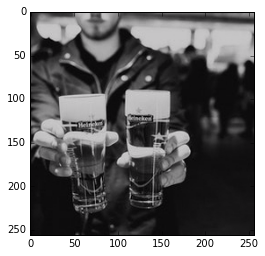

colored image


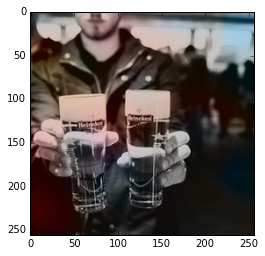

grayscale image


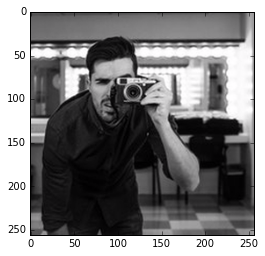

colored image


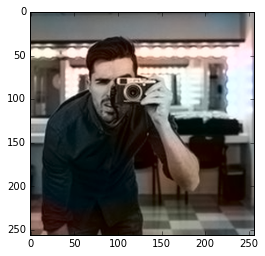

grayscale image


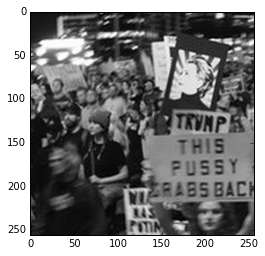

colored image


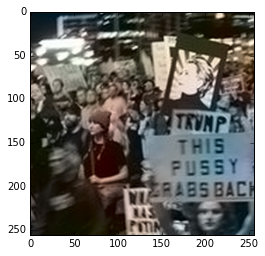

grayscale image


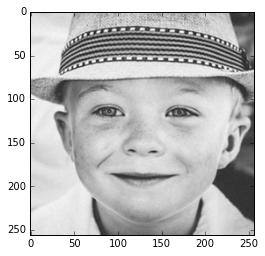

colored image


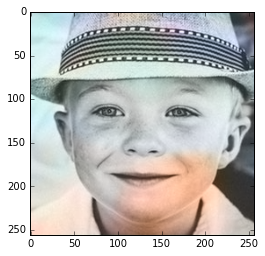

grayscale image


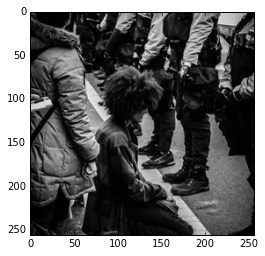

colored image


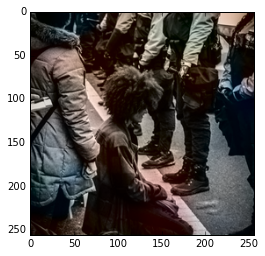

grayscale image


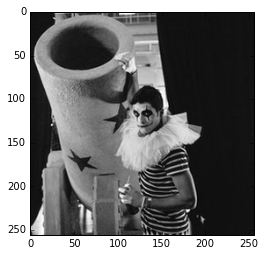

colored image


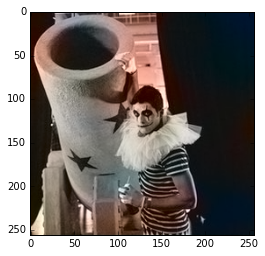

grayscale image


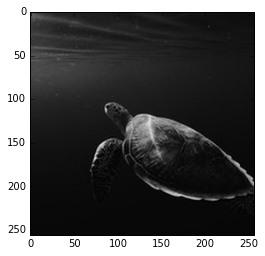

colored image


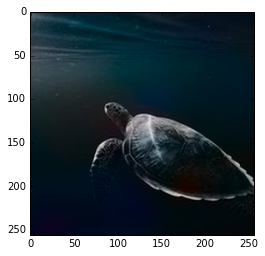

grayscale image


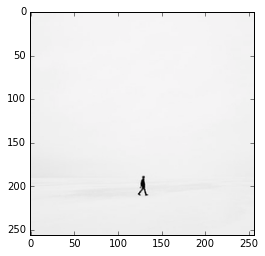

colored image


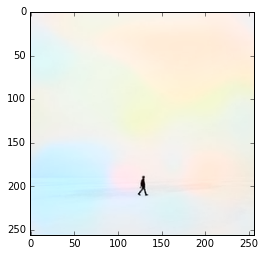

grayscale image


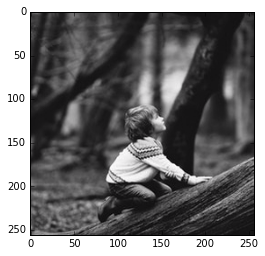

colored image


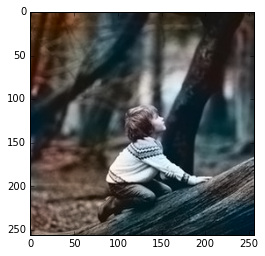

grayscale image


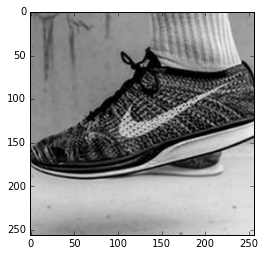

colored image


C:\Users\hp\Anaconda3\envs\tensorflow-gpu\lib\site-packages\skimage\color\colorconv.py:985: UserWarning: Color data out of range: Z < 0 in 5 pixels
  warn('Color data out of range: Z < 0 in %s pixels' % invalid[0].size)


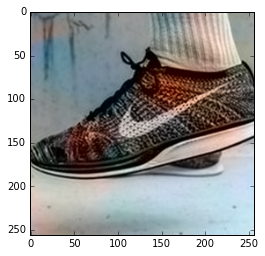

grayscale image


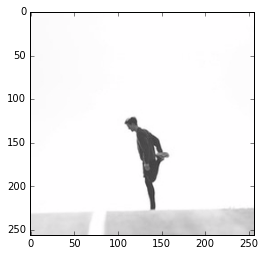

colored image


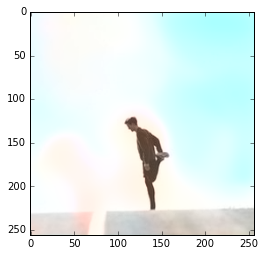

grayscale image


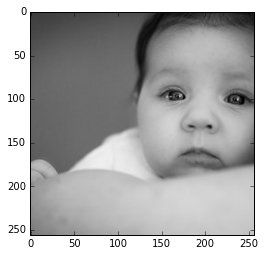

colored image


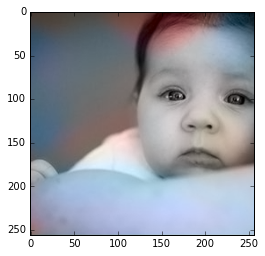

grayscale image


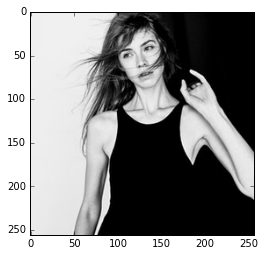

colored image


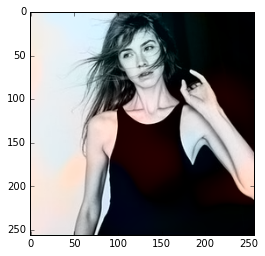

grayscale image


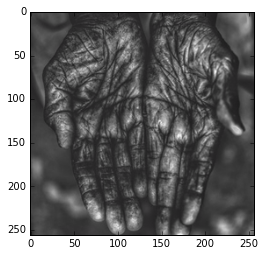

colored image


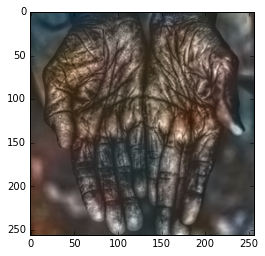

grayscale image


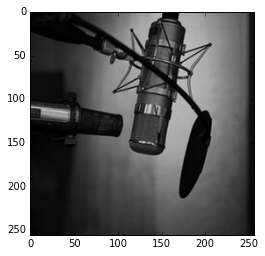

colored image


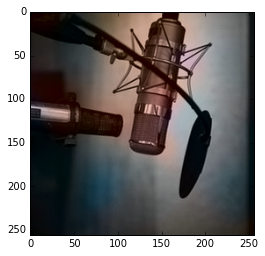

grayscale image


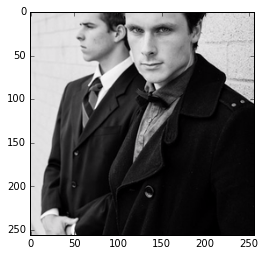

colored image


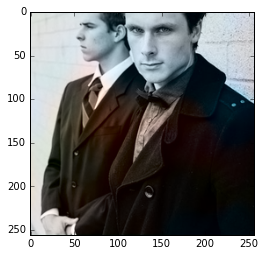

grayscale image


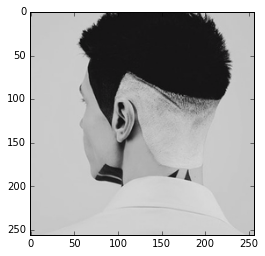

colored image


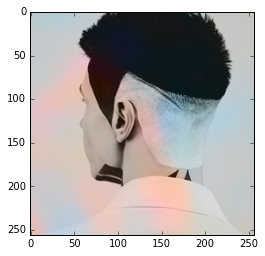

grayscale image


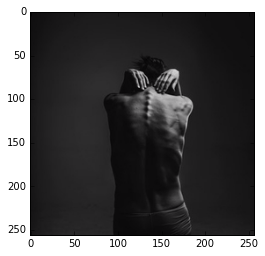

colored image


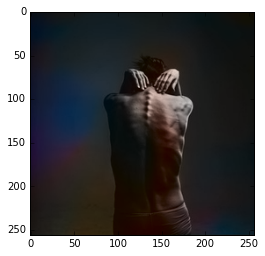

grayscale image


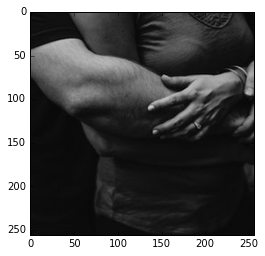

colored image


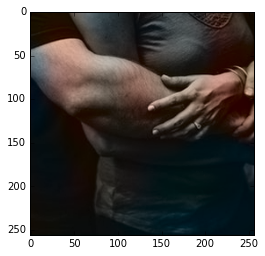

grayscale image


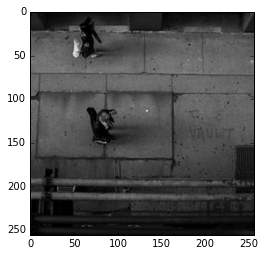

colored image


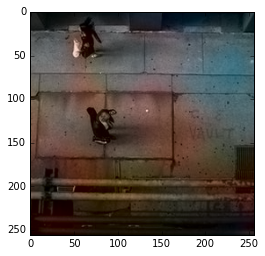

grayscale image


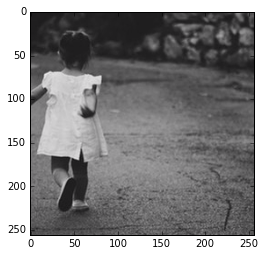

colored image


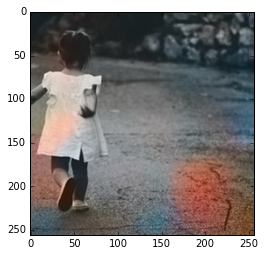

grayscale image


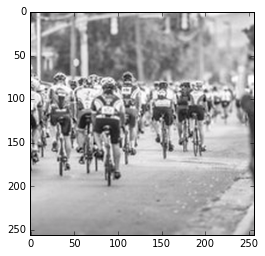

colored image


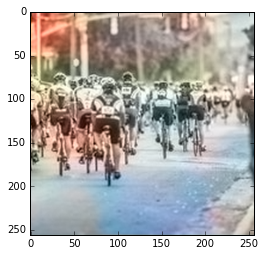

grayscale image


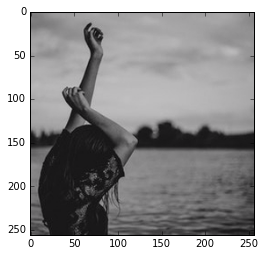

colored image


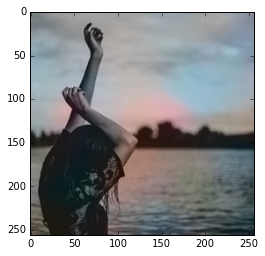

grayscale image


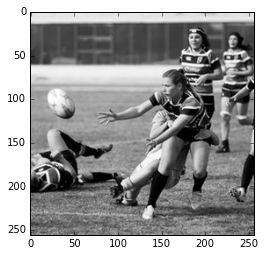

colored image


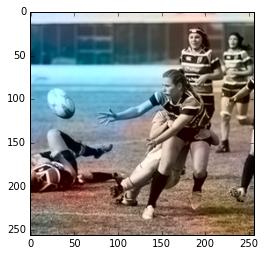

grayscale image


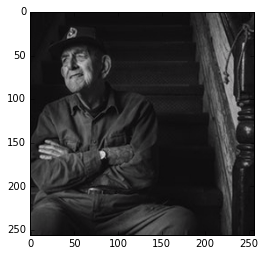

colored image


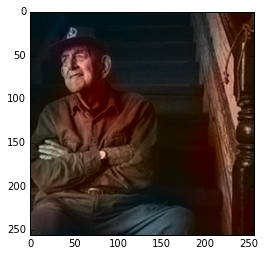

grayscale image


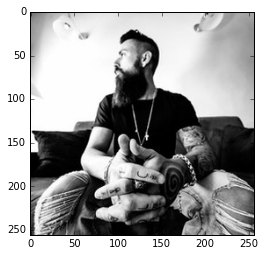

colored image


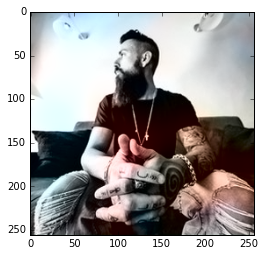

grayscale image


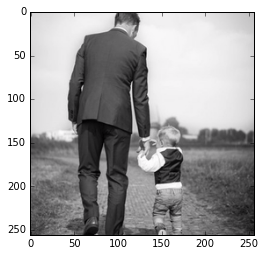

colored image


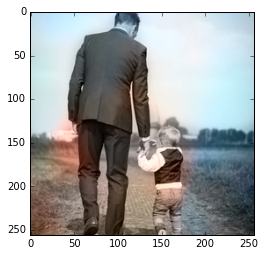

grayscale image


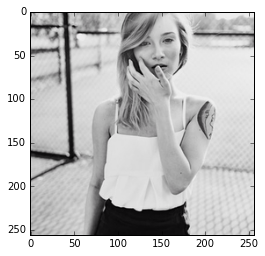

colored image


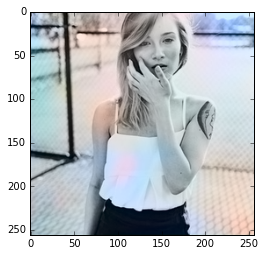

grayscale image


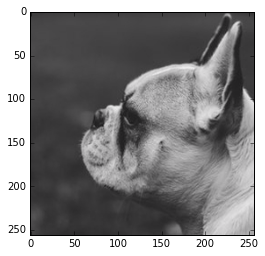

colored image


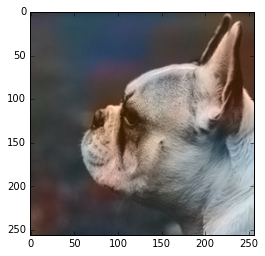

grayscale image


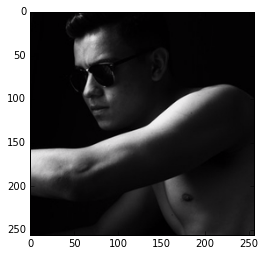

colored image


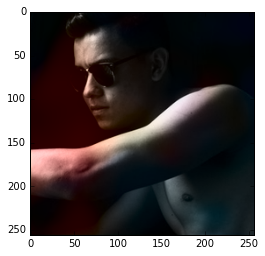

grayscale image


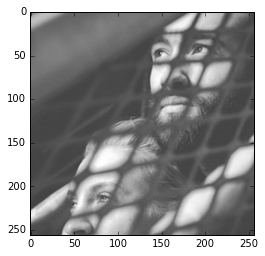

colored image


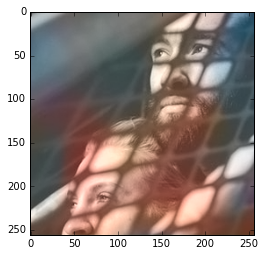

grayscale image


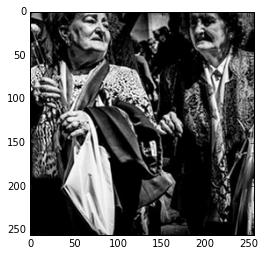

colored image


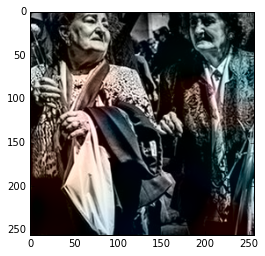

grayscale image


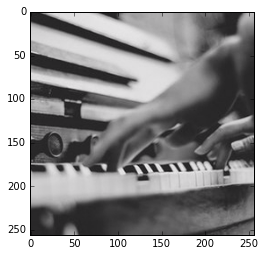

colored image


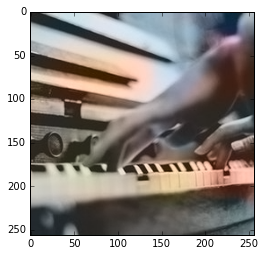

grayscale image


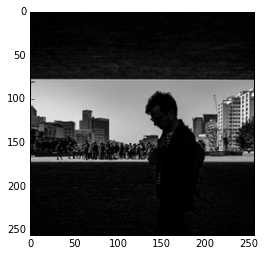

colored image


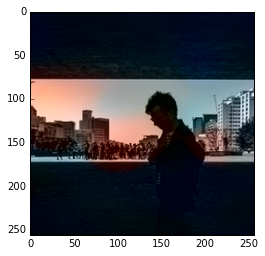

grayscale image


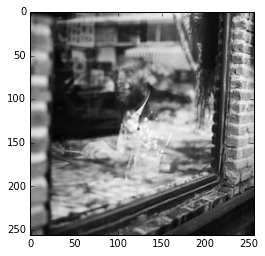

colored image


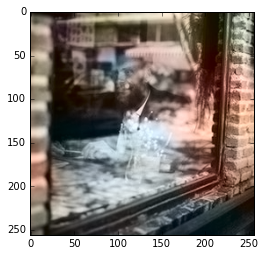

grayscale image


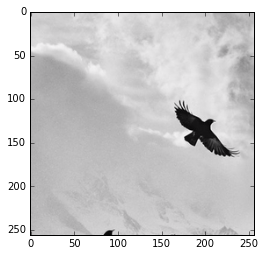

colored image


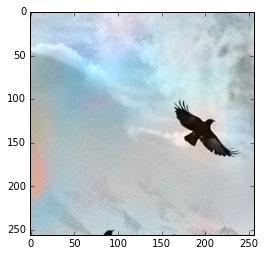

grayscale image


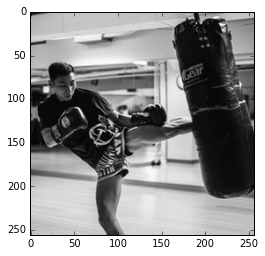

colored image


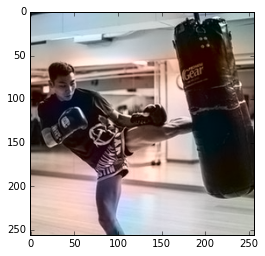

grayscale image


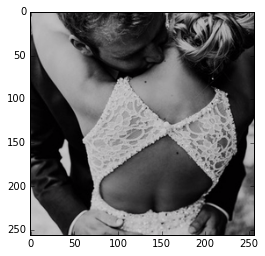

colored image


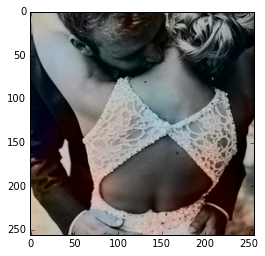

grayscale image


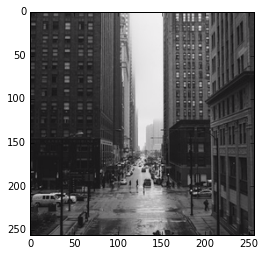

colored image


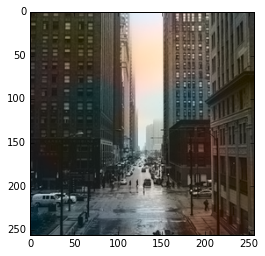

grayscale image


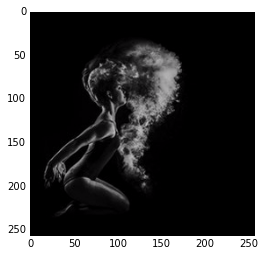

colored image


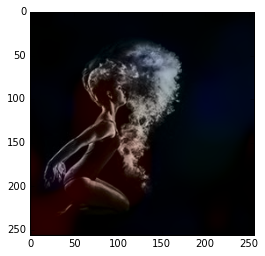

grayscale image


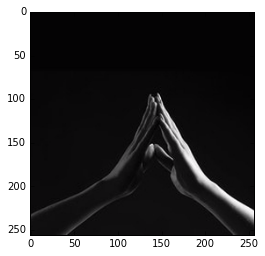

colored image


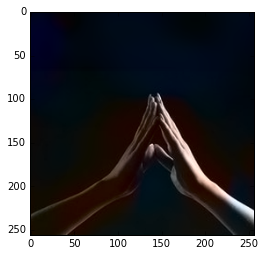

grayscale image


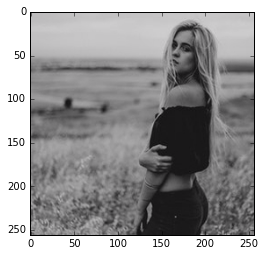

colored image


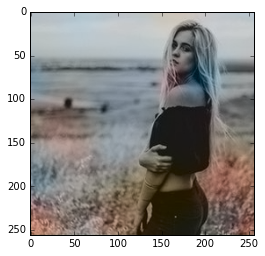

grayscale image


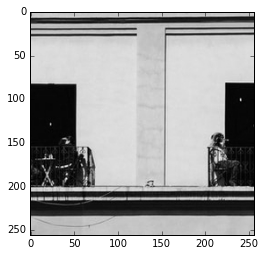

colored image


C:\Users\hp\Anaconda3\envs\tensorflow-gpu\lib\site-packages\skimage\color\colorconv.py:985: UserWarning: Color data out of range: Z < 0 in 73 pixels
  warn('Color data out of range: Z < 0 in %s pixels' % invalid[0].size)


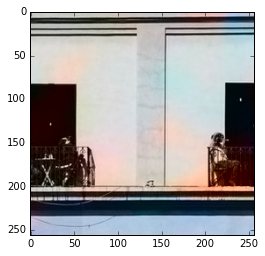

grayscale image


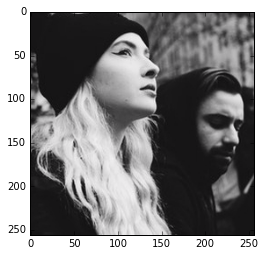

colored image


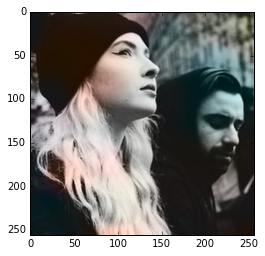

grayscale image


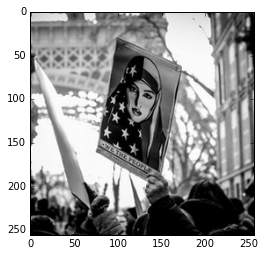

colored image


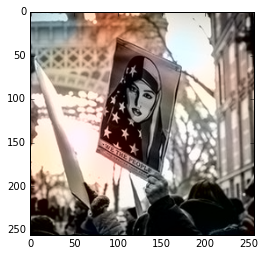

grayscale image


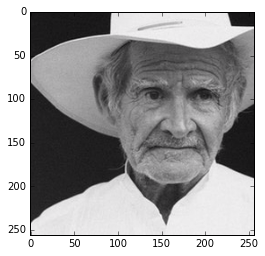

colored image


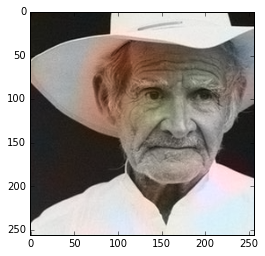

grayscale image


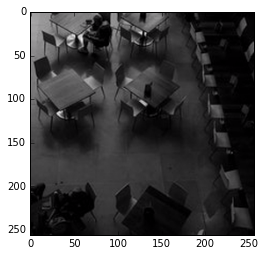

colored image


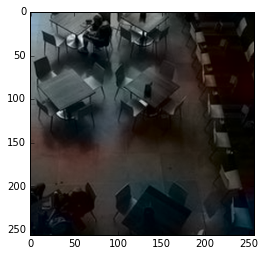

grayscale image


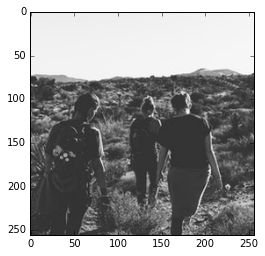

colored image


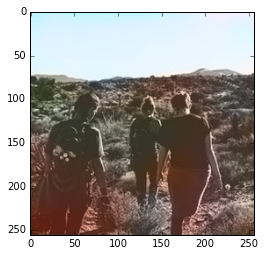

grayscale image


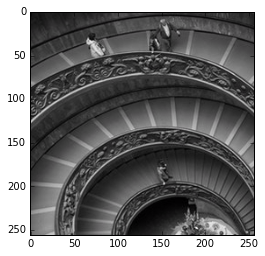

colored image


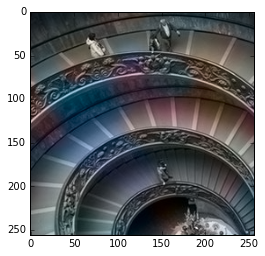

grayscale image


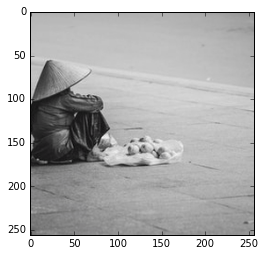

colored image


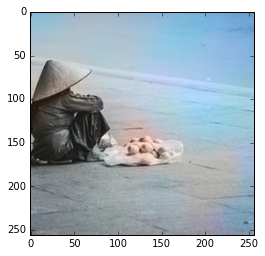

grayscale image


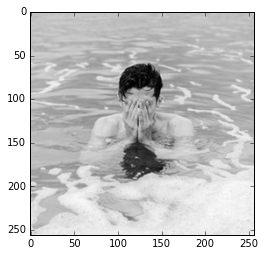

colored image


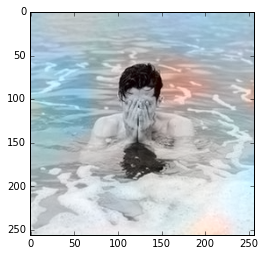

grayscale image


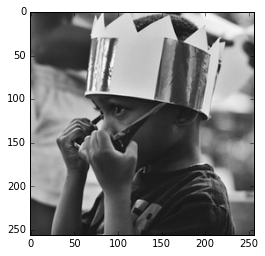

colored image


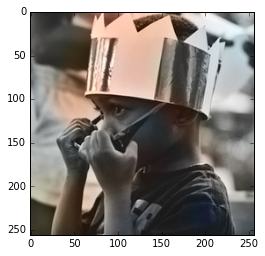

grayscale image


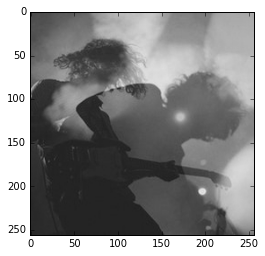

colored image


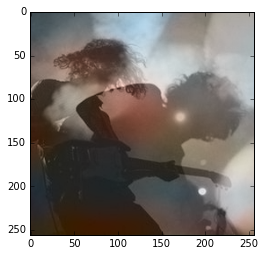

grayscale image


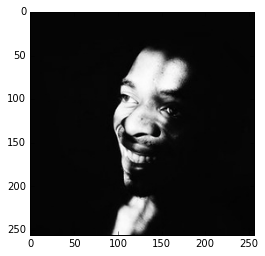

colored image


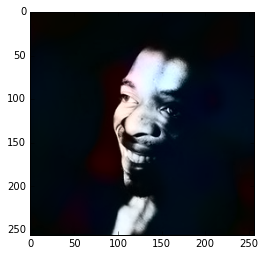

grayscale image


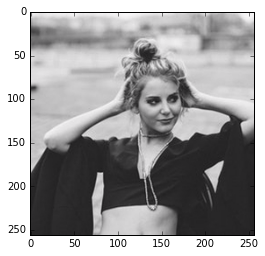

colored image


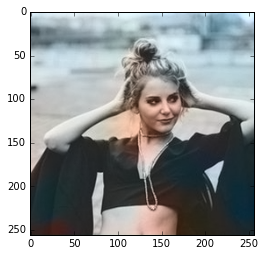

grayscale image


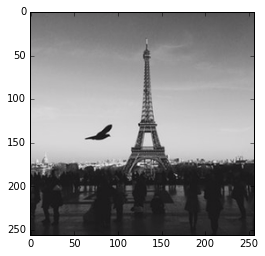

colored image


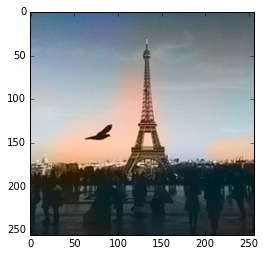

grayscale image


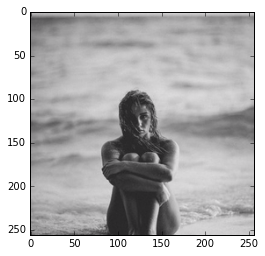

colored image


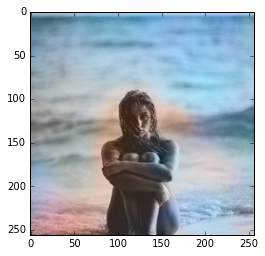

grayscale image


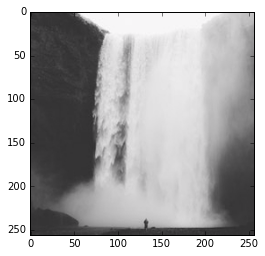

colored image


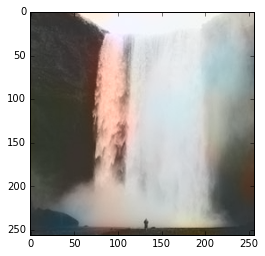

grayscale image


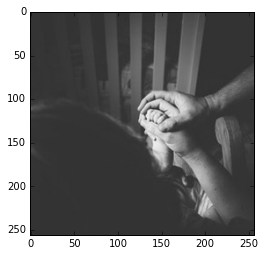

colored image


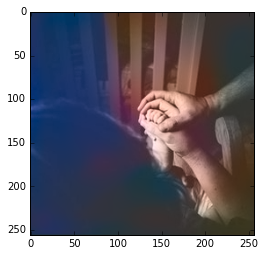

grayscale image


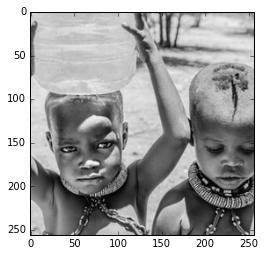

colored image


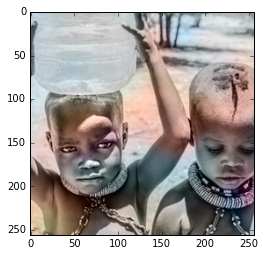

grayscale image


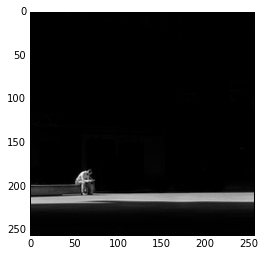

colored image


C:\Users\hp\Anaconda3\envs\tensorflow-gpu\lib\site-packages\skimage\color\colorconv.py:985: UserWarning: Color data out of range: Z < 0 in 327 pixels
  warn('Color data out of range: Z < 0 in %s pixels' % invalid[0].size)


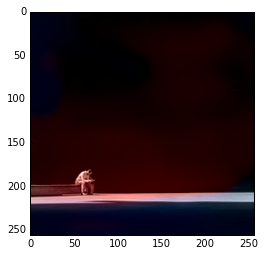

grayscale image


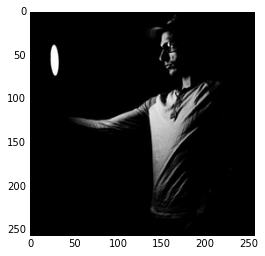

colored image


C:\Users\hp\Anaconda3\envs\tensorflow-gpu\lib\site-packages\skimage\color\colorconv.py:985: UserWarning: Color data out of range: Z < 0 in 9 pixels
  warn('Color data out of range: Z < 0 in %s pixels' % invalid[0].size)


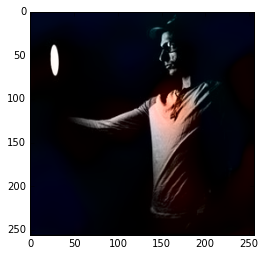

grayscale image


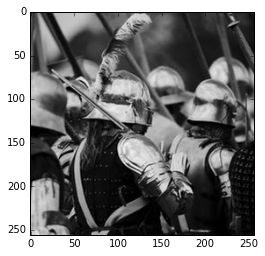

colored image


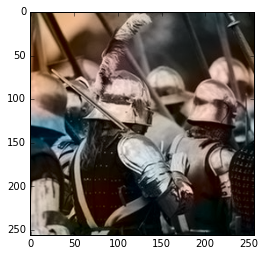

grayscale image


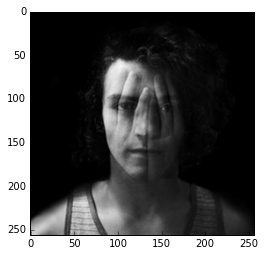

colored image


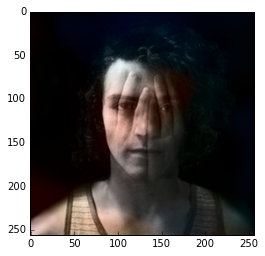

grayscale image


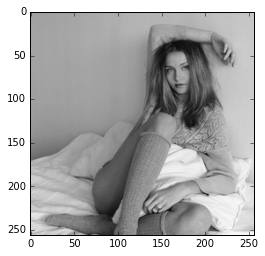

colored image


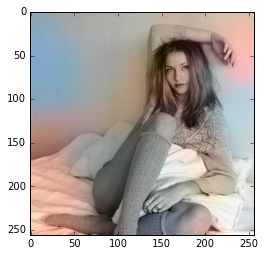

grayscale image


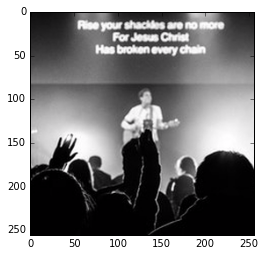

colored image


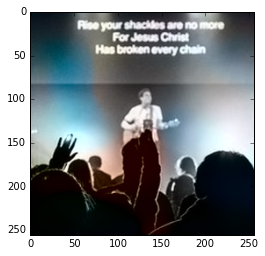

grayscale image


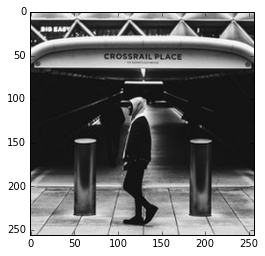

colored image


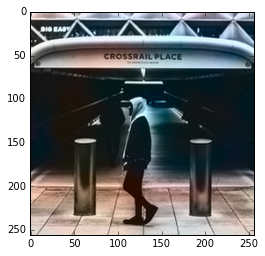

grayscale image


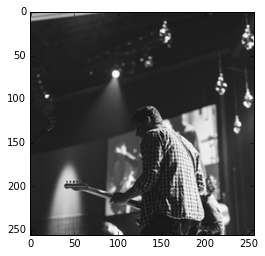

colored image


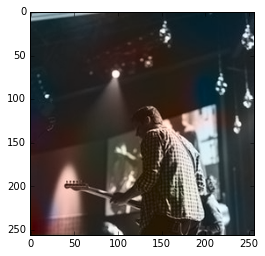

grayscale image


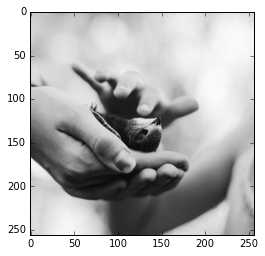

colored image


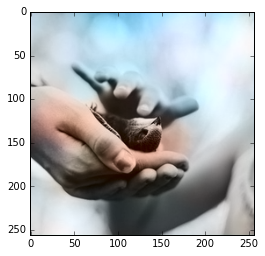

grayscale image


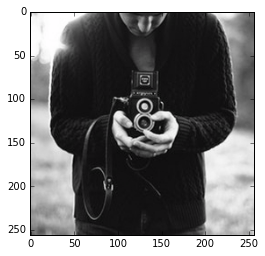

colored image


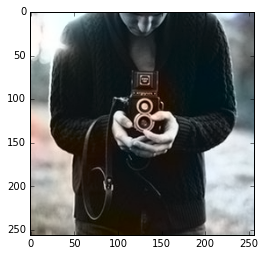

grayscale image


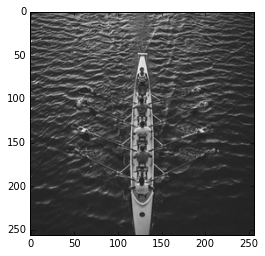

colored image


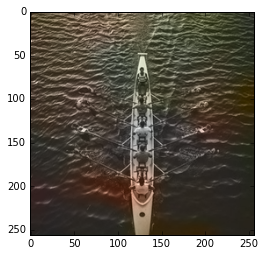

grayscale image


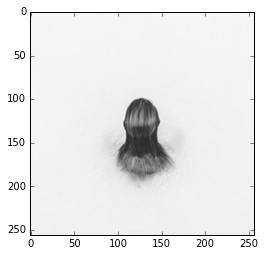

colored image


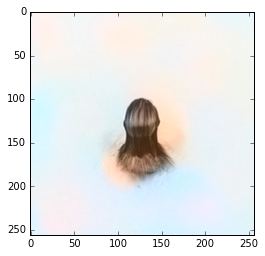

grayscale image


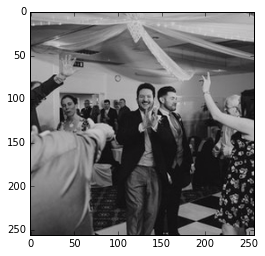

colored image


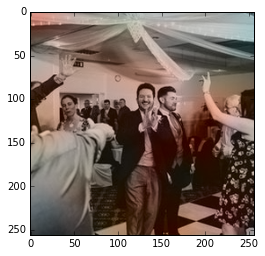

grayscale image


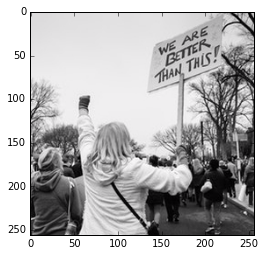

colored image


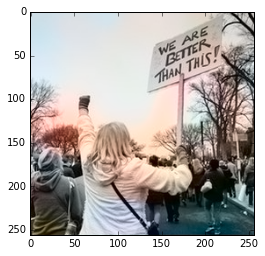

grayscale image


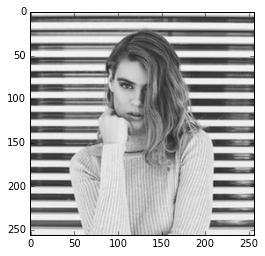

colored image


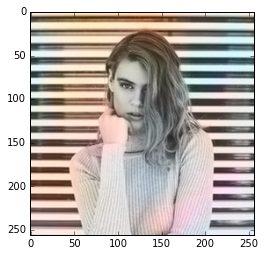

grayscale image


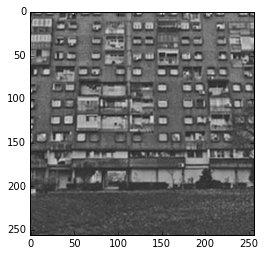

colored image


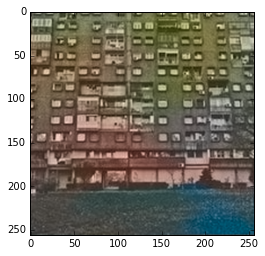

grayscale image


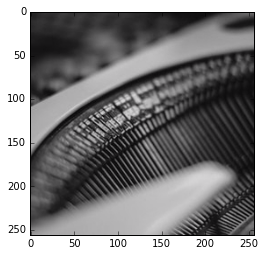

colored image


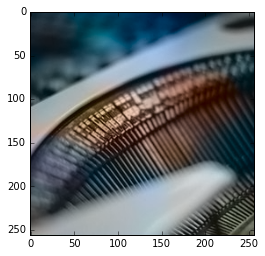

grayscale image


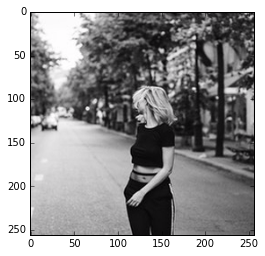

colored image


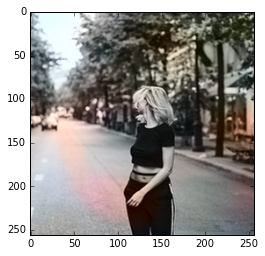

grayscale image


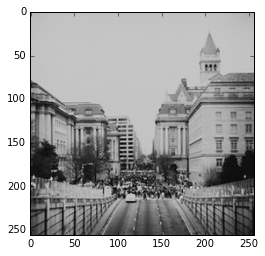

colored image


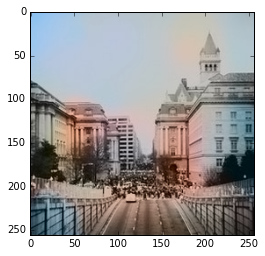

grayscale image


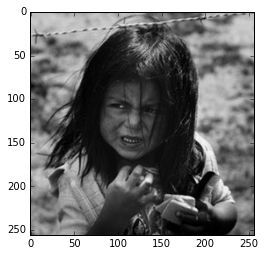

colored image


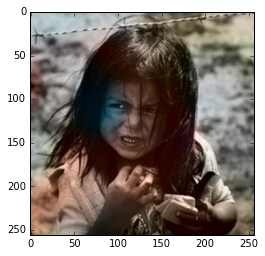

grayscale image


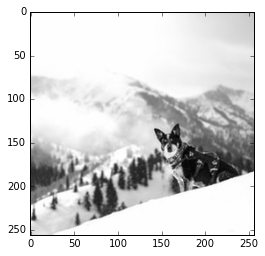

colored image


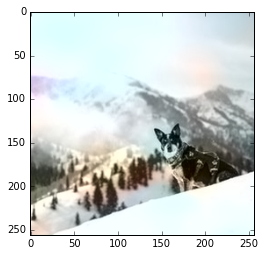

grayscale image


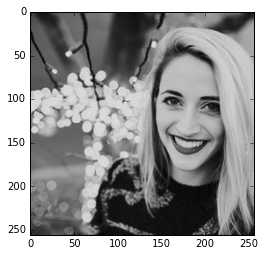

colored image


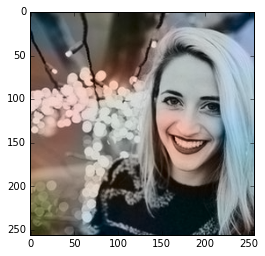

grayscale image


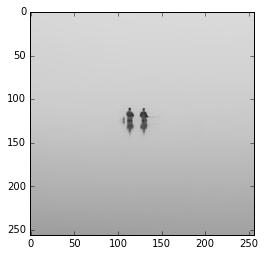

colored image


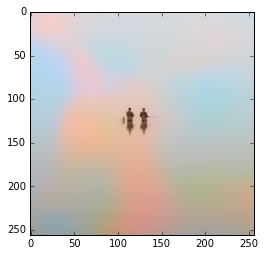

grayscale image


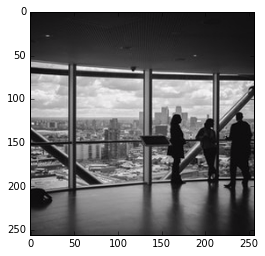

colored image


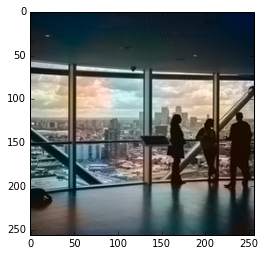

grayscale image


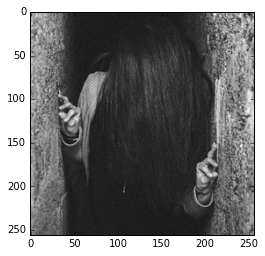

colored image


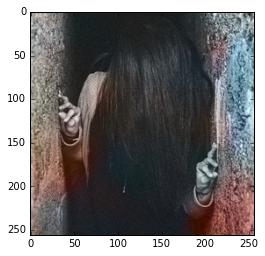

grayscale image


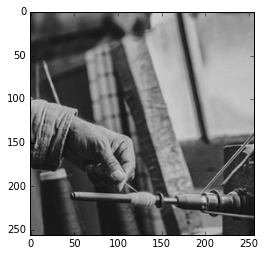

colored image


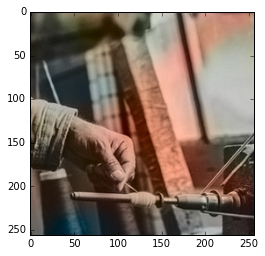

In [7]:
## run this cell
output = model(Variable(torch.Tensor(xtest)).cuda())
outp1 = (output.data).cpu().numpy()
outt = np.zeros((testnum, 256, 256, 2))
for i in range(testnum):
    outt = np.zeros((256, 256, 3))
    outt[:,:,0] = xtest[i][0]
    outt = color.lab2rgb(outt)
    print("grayscale image")
    plt.imshow(outt)
    plt.show()
    outt = np.zeros((256, 256, 2))
    outt[:,:,0] = outp1[i][0][:,:]
    outt[:,:,1] = outp1[i][1][:,:]
    outt = outt*128
    pimage = np.zeros((256, 256, 3))
    pimage[:,:,0] = xtest[i][0]
    pimage[:,:,1:] = outt
    print("colored image")
    pimage = color.lab2rgb(pimage)
    plt.imshow(pimage)
    plt.show()